In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import auc
import os
import sys
import seaborn as sns

In [2]:
plt.rcParams.update({
    'font.size': 17,
    'axes.linewidth': 1.2,
    'axes.titlesize': 18,
    'axes.labelsize': 16,
    'xtick.labelsize': 14,
    'ytick.labelsize': 14,
    'legend.fontsize': 15,
})

In [3]:
# Load the predictiosn by C0 on its held out set
val_c0 = pd.read_csv('/zhome/d0/a/221493/thesis/results/C0_custom/effusion/val_c0_effusion.csv')

In [4]:
val_c0

,path,prob,true,emb_0,emb_1,emb_2,emb_3,emb_4,emb_5,emb_6,...,emb_1017,emb_1018,emb_1019,emb_1020,emb_1021,emb_1022,emb_1023,pred,correct,margin
0,CheXpert-v1.0-small/train/patient00005/study1/...,0.041813,0.0,-0.001189,-0.001186,0.002146,0.004988,-0.102878,0.176344,-0.001303,...,-1.470790,-0.547518,2.685852,-0.280901,-0.093086,0.316664,-0.811988,0,1,0.521546
1,CheXpert-v1.0-small/train/patient00005/study1/...,0.023395,0.0,-0.001175,-0.003648,0.004755,0.003995,0.049837,-0.378222,-0.001306,...,-0.907484,-0.311923,1.079148,-0.208475,-0.323421,-0.611174,-0.665395,0,1,0.539964
2,CheXpert-v1.0-small/train/patient00006/study1/...,0.215646,0.0,-0.001187,-0.003954,0.007097,0.003398,-0.039020,0.381182,-0.001332,...,-0.356944,-0.308886,0.721886,-0.315123,-0.147007,0.307970,0.387046,0,1,0.347713
3,CheXpert-v1.0-small/train/patient00008/study1/...,0.989891,1.0,-0.001258,-0.002981,0.004603,0.001782,0.038358,0.399419,-0.001282,...,2.520930,1.158903,-0.170984,0.195130,1.108715,1.536098,0.918089,1,1,0.426532
4,CheXpert-v1.0-small/train/patient00008/study2/...,0.803473,1.0,-0.001191,-0.002815,0.002819,0.001348,0.057667,0.703849,-0.001344,...,1.395438,-0.341221,-0.588831,-0.476432,0.023566,0.816742,1.562695,1,1,0.240114
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61437,CheXpert-v1.0-small/train/patient64526/study1/...,0.694489,1.0,-0.001232,-0.003229,0.004853,0.001693,-0.009808,0.175120,-0.001297,...,0.959461,0.204449,0.113860,-0.199806,0.535302,1.150561,1.297390,1,1,0.131130
61438,CheXpert-v1.0-small/train/patient64527/study2/...,0.982114,1.0,-0.001211,-0.001985,0.004586,0.003741,0.141622,0.686863,-0.001295,...,1.335373,1.124347,0.363713,1.572156,1.525647,1.483058,3.280765,1,1,0.418755
61439,CheXpert-v1.0-small/train/patient64527/study1/...,0.990660,1.0,-0.001213,-0.001430,0.004003,0.001733,0.056065,0.597711,-0.001310,...,1.346961,1.443308,0.030333,1.092859,1.279575,1.117594,3.261425,1,1,0.427301
61440,CheXpert-v1.0-small/train/patient64531/study1/...,0.629145,1.0,-0.001224,-0.002299,0.005066,0.007444,0.043731,0.223962,-0.001326,...,1.450792,0.019806,-0.188909,-0.038766,0.166614,0.557639,2.157006,1,1,0.065786


In [5]:
# Relevant columns: prob, true, pred, correct, margin
# Create a copy with just these columns
val_c0_reduced = val_c0[['path', 'prob', 'true', 'pred', 'correct', 'margin']].copy()
val_c0_reduced

,path,prob,true,pred,correct,margin
0,CheXpert-v1.0-small/train/patient00005/study1/...,0.041813,0.0,0,1,0.521546
1,CheXpert-v1.0-small/train/patient00005/study1/...,0.023395,0.0,0,1,0.539964
2,CheXpert-v1.0-small/train/patient00006/study1/...,0.215646,0.0,0,1,0.347713
3,CheXpert-v1.0-small/train/patient00008/study1/...,0.989891,1.0,1,1,0.426532
4,CheXpert-v1.0-small/train/patient00008/study2/...,0.803473,1.0,1,1,0.240114
...,...,...,...,...,...,...
61437,CheXpert-v1.0-small/train/patient64526/study1/...,0.694489,1.0,1,1,0.131130
61438,CheXpert-v1.0-small/train/patient64527/study2/...,0.982114,1.0,1,1,0.418755
61439,CheXpert-v1.0-small/train/patient64527/study1/...,0.990660,1.0,1,1,0.427301
61440,CheXpert-v1.0-small/train/patient64531/study1/...,0.629145,1.0,1,1,0.065786


In [6]:
# Separate by class (positice for effusion, negative for no effusion)
val_c0_positive = val_c0_reduced[val_c0_reduced['true'] == 1]
val_c0_negative = val_c0_reduced[val_c0_reduced['true'] == 0]

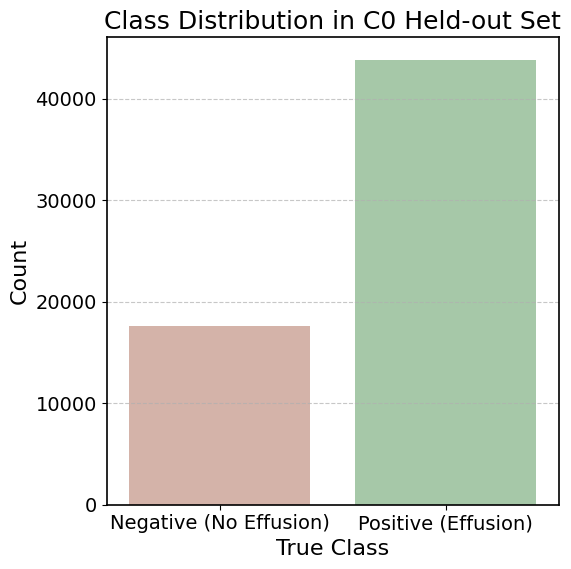

In [7]:
# Plot number of sampels per class as hist
plt.figure(figsize=(6, 6))
sns.countplot(x='true', data=val_c0_reduced, palette=["#ba6146", "#439e49"], alpha=0.5)
plt.xticks([0, 1], ['Negative (No Effusion)', 'Positive (Effusion)'])
plt.title('Class Distribution in C0 Held-out Set')
plt.xlabel('True Class')
plt.ylabel('Count')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

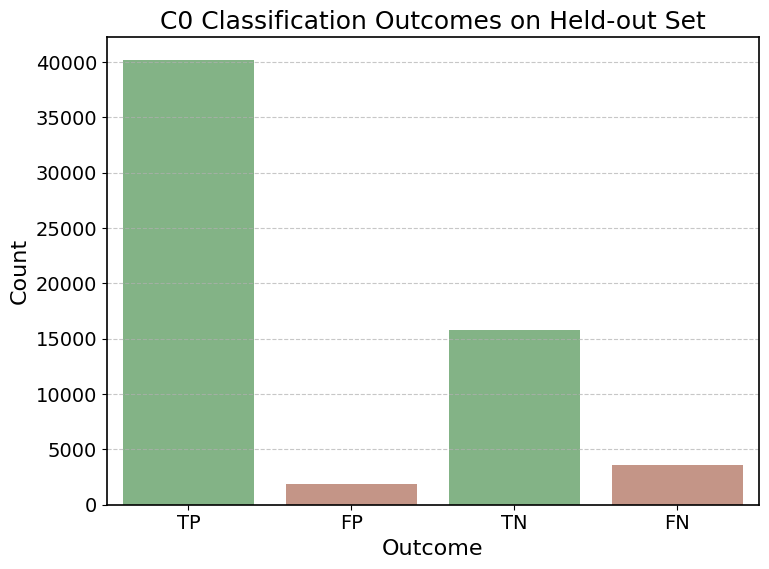

In [8]:
# Bar plot of c0'S : TP, FP, TN, FN
val_c0_reduced['outcome'] = val_c0_reduced.apply(lambda row:
    'TP' if row['true'] == 1 and row['pred'] == 1 else
    'FP' if row['true'] == 0 and row['pred'] == 1 else
    'TN' if row['true'] == 0 and row['pred'] == 0 else
    'FN', axis=1)   
outcome_counts = val_c0_reduced['outcome'].value_counts().reindex(['TP', 'FP', 'TN', 'FN'])
plt.figure(figsize=(8, 6))
sns.barplot(x=outcome_counts.index, y=outcome_counts.values, palette=["#439e49", "#ba6146", "#439e49", "#ba6146"], alpha=0.7)
plt.title('C0 Classification Outcomes on Held-out Set')
plt.xlabel('Outcome')
plt.ylabel('Count')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

Positive samples: 43843
Negative samples: 17599


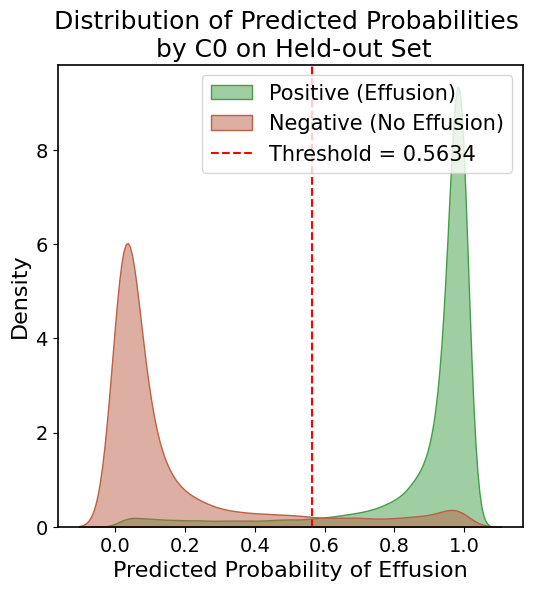

In [9]:
# Print sizes
print(f"Positive samples: {len(val_c0_positive)}")
print(f"Negative samples: {len(val_c0_negative)}")
# Plot histograms of the predicted probabilities for both classes in th esame plot (2 colours), make curves semi-transparent so we can see overlap, add labels and legend
# Gaussian KDE plot instead of histogram
plt.figure(figsize=(6, 6))
sns.kdeplot(val_c0_positive['prob'], label='Positive (Effusion)', fill=True, alpha=0.5, color="#439e49")
sns.kdeplot(val_c0_negative['prob'], label='Negative (No Effusion)', fill=True, alpha=0.5, color="#ba6146")
# Add line at threshold = 0.5634
threshold = 0.5634
plt.axvline(x=threshold, color='red', linestyle='--', label=f'Threshold = {threshold:.4f}')
plt.title('Distribution of Predicted Probabilities \n by C0 on Held-out Set')
plt.xlabel('Predicted Probability of Effusion')
plt.ylabel('Density')
plt.legend()
plt.show()

Confusion Matrix at Threshold 0.5634:
[[15745  1854]
 [ 3617 40226]]


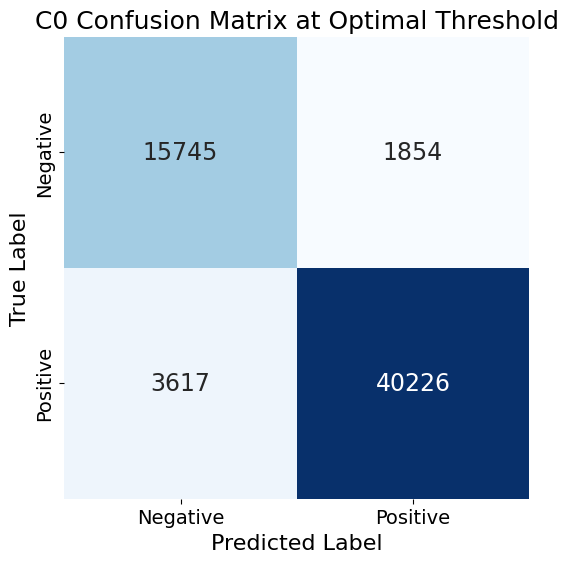

In [10]:
# Confusion matrix at threshold 0.5634
from sklearn.metrics import confusion_matrix    
y_true = val_c0_reduced['true']
y_pred = (val_c0_reduced['prob'] >= threshold).astype(int)
cm = confusion_matrix(y_true, y_pred)
print("Confusion Matrix at Threshold 0.5634:")
print(cm)   

# Plot the confusion matrix as a heatmap
plt.figure(figsize=(6, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('C0 Confusion Matrix at Optimal Threshold')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.xticks([0.5, 1.5], ['Negative', 'Positive'])
plt.yticks([0.5, 1.5], ['Negative', 'Positive'])
plt.show()

In [11]:
# Load original train set 
full_train = pd.read_csv('/zhome/d0/a/221493/thesis/data/CheXpert-v1.0-small/train.csv')
print(f"Full train set size: {len(full_train)}")
print(f"Columns of full train set: {full_train.columns.tolist()}")

Full train set size: 223414
Columns of full train set: ['Path', 'Sex', 'Age', 'Frontal/Lateral', 'AP/PA', 'No Finding', 'Enlarged Cardiomediastinum', 'Cardiomegaly', 'Lung Opacity', 'Lung Lesion', 'Edema', 'Consolidation', 'Pneumonia', 'Atelectasis', 'Pneumothorax', 'Pleural Effusion', 'Pleural Other', 'Fracture', 'Support Devices']


In [12]:
# Get reduced version woth onlu Path and 'Support Devices'
full_train_reduced = full_train[['Path', 'Support Devices']].copy()
print(full_train_reduced.head())

                                                Path  Support Devices
0  CheXpert-v1.0-small/train/patient00001/study1/...              1.0
1  CheXpert-v1.0-small/train/patient00002/study2/...              NaN
2  CheXpert-v1.0-small/train/patient00002/study1/...              NaN
3  CheXpert-v1.0-small/train/patient00002/study1/...              NaN
4  CheXpert-v1.0-small/train/patient00003/study1/...              NaN


In [13]:
# chekc how path is written in both csvs
print(f"Example path in val_c0_reduced: {val_c0_reduced['path'].iloc[0]}")
print(f"Example path in full_train: {full_train['Path'].iloc[0]}")

#

Example path in val_c0_reduced: CheXpert-v1.0-small/train/patient00005/study1/view1_frontal.jpg
Example path in full_train: CheXpert-v1.0-small/train/patient00001/study1/view1_frontal.jpg


In [14]:
# Merge val_c0_reduced with full_train_reduced on the path column to get the 'Support Devices' column for each sample in val_c0_reduced
merged_with_support_devices = pd.merge(val_c0_reduced, full_train_reduced, left_on='path', right_on='Path')
merged_with_support_devices

# Fill missing values in 'Support Devices' with 'Missing'
merged_with_support_devices['Support Devices'] = merged_with_support_devices['Support Devices'].fillna('Missing')
merged_with_support_devices

,path,prob,true,pred,correct,margin,outcome,Path,Support Devices
0,CheXpert-v1.0-small/train/patient00005/study1/...,0.041813,0.0,0,1,0.521546,TN,CheXpert-v1.0-small/train/patient00005/study1/...,1.0
1,CheXpert-v1.0-small/train/patient00005/study1/...,0.023395,0.0,0,1,0.539964,TN,CheXpert-v1.0-small/train/patient00005/study1/...,1.0
2,CheXpert-v1.0-small/train/patient00006/study1/...,0.215646,0.0,0,1,0.347713,TN,CheXpert-v1.0-small/train/patient00006/study1/...,Missing
3,CheXpert-v1.0-small/train/patient00008/study1/...,0.989891,1.0,1,1,0.426532,TP,CheXpert-v1.0-small/train/patient00008/study1/...,1.0
4,CheXpert-v1.0-small/train/patient00008/study2/...,0.803473,1.0,1,1,0.240114,TP,CheXpert-v1.0-small/train/patient00008/study2/...,1.0
...,...,...,...,...,...,...,...,...,...
61437,CheXpert-v1.0-small/train/patient64526/study1/...,0.694489,1.0,1,1,0.131130,TP,CheXpert-v1.0-small/train/patient64526/study1/...,Missing
61438,CheXpert-v1.0-small/train/patient64527/study2/...,0.982114,1.0,1,1,0.418755,TP,CheXpert-v1.0-small/train/patient64527/study2/...,1.0
61439,CheXpert-v1.0-small/train/patient64527/study1/...,0.990660,1.0,1,1,0.427301,TP,CheXpert-v1.0-small/train/patient64527/study1/...,1.0
61440,CheXpert-v1.0-small/train/patient64531/study1/...,0.629145,1.0,1,1,0.065786,TP,CheXpert-v1.0-small/train/patient64531/study1/...,1.0


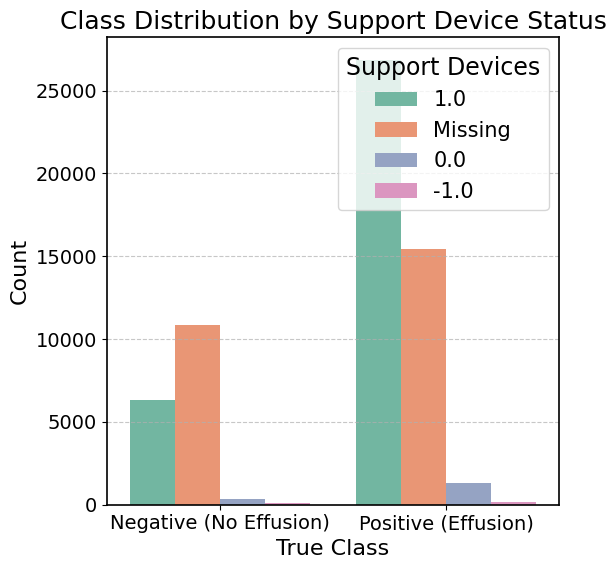

In [15]:
# Plot bar plot. X axys = effusion labels, hue = support devices (-1, 0 or 1 or "Missing")
plt.figure(figsize=(6, 6))
sns.countplot(x='true', hue='Support Devices', data=merged_with_support_devices, palette="Set2")
plt.xticks([0, 1], ['Negative (No Effusion)', 'Positive (Effusion)'])
plt.title('Class Distribution by Support Device Status')
plt.xlabel('True Class')
plt.ylabel('Count')
plt.legend(title='Support Devices', loc='upper right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

---

In [ ]:
# Overall stats at threshold 0.5634
from sklearn.metrics import classification_report
report = classification_report(y_true, y_pred, target_names=['Negative (No Effusion)', 'Positive (Effusion)'])
print("Classification Report at Threshold 0.5634:")
print(report)

Classification Report at Threshold 0.5634:
                        precision    recall  f1-score   support

Negative (No Effusion)       0.81      0.89      0.85     17599
   Positive (Effusion)       0.96      0.92      0.94     43843

              accuracy                           0.91     61442
             macro avg       0.88      0.91      0.89     61442
          weighted avg       0.92      0.91      0.91     61442



# C2 analysis

In [4]:
# Look at C2 preictions inc cross val
fold_0 = pd.read_csv("/zhome/d0/a/221493/thesis/results/C2_custom/effusion/cv_results/cf_1/fold_0_predictions.csv")
fold_1 = pd.read_csv("/zhome/d0/a/221493/thesis/results/C2_custom/effusion/cv_results/cf_1/fold_1_predictions.csv")
fold_2 = pd.read_csv("/zhome/d0/a/221493/thesis/results/C2_custom/effusion/cv_results/cf_1/fold_2_predictions.csv")
fold_3 = pd.read_csv("/zhome/d0/a/221493/thesis/results/C2_custom/effusion/cv_results/cf_1/fold_3_predictions.csv")

combined_folds = pd.concat([fold_0, fold_1, fold_2, fold_3], ignore_index=True)
combined_folds

,path,effusion_prob,effusion_true,emb_0,emb_1,emb_2,emb_3,emb_4,emb_5,emb_6,...,MLP_B2_prob,MLP_B3_prob,MLP_B4_prob,MLP_B5_prob,MLP_M1_prob,MLP_M2_prob,MLP_M3_prob,MLP_M4_prob,MLP_M5_prob,MLP_M6_prob
0,CheXpert-v1.0-small/train/patient00008/study1/...,0.989891,1.0,-0.001258,-0.002981,0.004603,0.001782,0.038358,0.399419,-0.001282,...,0.911461,0.992634,0.937656,0.988203,0.909241,0.848866,0.998682,0.998487,0.990728,0.997966
1,CheXpert-v1.0-small/train/patient00008/study2/...,0.803473,1.0,-0.001191,-0.002815,0.002819,0.001348,0.057667,0.703849,-0.001344,...,0.931416,0.959766,0.932353,0.998319,0.888825,0.895256,0.933287,0.930484,0.819694,0.992411
2,CheXpert-v1.0-small/train/patient00010/study1/...,0.022443,0.0,-0.001185,-0.000544,0.002301,0.005169,-0.117937,-0.033050,-0.001290,...,0.977377,0.981621,0.970851,0.976558,0.942640,0.855762,0.841760,0.990347,0.971744,0.997481
3,CheXpert-v1.0-small/train/patient00012/study2/...,0.061503,0.0,-0.001186,-0.001272,0.003885,0.003653,-0.103996,0.122837,-0.001299,...,0.923050,0.896430,0.916926,0.855302,0.783236,0.781745,0.860065,0.931055,0.948937,0.985931
4,CheXpert-v1.0-small/train/patient00012/study1/...,0.029165,0.0,-0.001169,-0.001557,0.002562,0.004091,-0.134545,0.211838,-0.001316,...,0.947813,0.964731,0.955979,0.950232,0.814668,0.826157,0.995274,0.943991,0.971332,0.995583
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36119,CheXpert-v1.0-small/train/patient47307/study2/...,0.100426,0.0,-0.001168,-0.001884,0.004061,0.003851,-0.065745,0.431070,-0.001281,...,0.850474,0.892329,0.863913,0.920652,0.953491,0.932078,0.996456,0.915686,0.995483,0.976844
36120,CheXpert-v1.0-small/train/patient47321/study1/...,0.053499,0.0,-0.001145,-0.001804,0.002086,0.004803,-0.040169,-0.102260,-0.001305,...,0.791754,0.835875,0.930404,0.954792,0.978486,0.834818,0.985559,0.806667,0.920670,0.992859
36121,CheXpert-v1.0-small/train/patient47322/study1/...,0.009908,0.0,-0.001170,-0.001727,0.003157,0.007460,-0.125203,-0.161531,-0.001279,...,0.851670,0.965590,0.906801,0.986542,0.980254,0.998177,0.923187,0.931643,0.993758,0.911063
36122,CheXpert-v1.0-small/train/patient47326/study11...,0.993676,1.0,-0.001186,-0.003257,0.006609,0.003639,0.017680,0.507635,-0.001264,...,0.988707,0.988407,0.988231,0.984116,0.998924,0.999925,0.999403,0.988201,1.000000,0.999988


In [ ]:
# Relevant columns: prob, true, pred, correct, margin
# Create a copy with just these columns
folds_reduced = combined_folds[['path', 'effusion_prob', 'effusion_true', 'effusion_pred', 'correct', 'margin', 'LR_B1_prob']].copy()
folds_reduced

: 

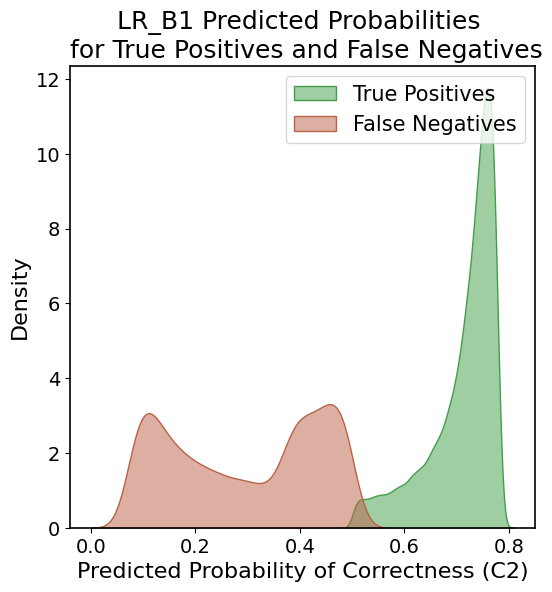

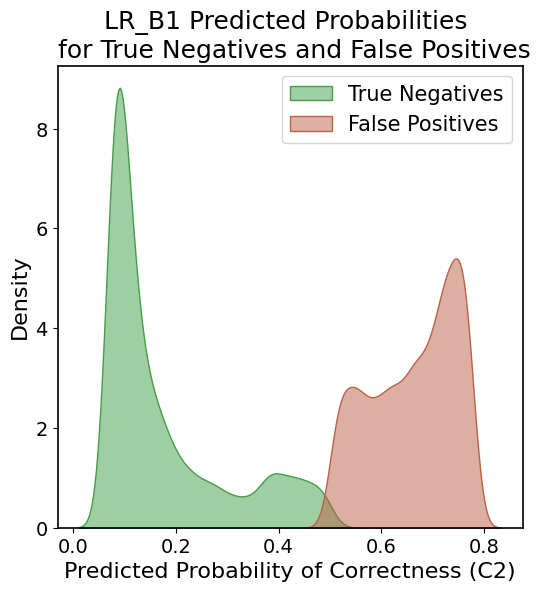

In [36]:

# Plot LR_B1_prob distribution for tyure positives andfalse negatives for disease present and true negatives and false positives for disease absent
# Two plots, one for disease present and one for disease absent
# Disease present (true positives and false negatives)
plt.figure(figsize=(6, 6))
sns.kdeplot(folds_reduced[(folds_reduced['effusion_true'] == 1) & (folds_reduced['correct'] == 1)]['LR_B1_prob'], label='True Positives', fill=True, alpha=0.5, color="#439e49")
sns.kdeplot(folds_reduced[(folds_reduced['effusion_true'] == 1) & (folds_reduced['correct'] == 0)]['LR_B1_prob'], label='False Negatives', fill=True, alpha=0.5, color="#ba6146")    
plt.title('LR_B1 Predicted Probabilities \n for True Positives and False Negatives')
plt.xlabel('Predicted Probability of Correctness (C2)')
plt.ylabel('Density')
plt.legend()
plt.show()

# Disease absent (true negatives and false positives)
plt.figure(figsize=(6, 6))
sns.kdeplot(folds_reduced[(folds_reduced['effusion_true'] == 0) & (folds_reduced['correct'] == 1)]['LR_B1_prob'], label='True Negatives', fill=True, alpha=0.5, color="#439e49")
sns.kdeplot(folds_reduced[(folds_reduced['effusion_true'] == 0) & (folds_reduced['correct'] == 0)]['LR_B1_prob'], label='False Positives', fill=True, alpha=0.5, color="#ba6146")    
plt.title('LR_B1 Predicted Probabilities \n for True Negatives and False Positives')
plt.xlabel('Predicted Probability of Correctness (C2)')
plt.ylabel('Density')
plt.legend()
plt.show()

In [40]:
# Print numebr of each erros of C0 : TP, FP, TN, FN
outcome_counts_c0 = val_c0_reduced['outcome'].value_counts().reindex(['TP', 'FP', 'TN', 'FN'])
print("C0 Classification Outcomes:")
print(outcome_counts_c0)

# print positive/negatuive ratio
total_positive = outcome_counts_c0['TP'] + outcome_counts_c0['FN']
total_negative = outcome_counts_c0['FP'] + outcome_counts_c0['TN']
ratio_positives = total_positive / (total_positive + total_negative)
print(f"Total positive samples: {total_positive}")
print(f"Total negative samples: {total_negative}")
print(f"Ratio of positives: {ratio_positives:.4f}")

C0 Classification Outcomes:
outcome
TP    40226
FP     1854
TN    15745
FN     3617
Name: count, dtype: int64
Total positive samples: 43843
Total negative samples: 17599
Ratio of positives: 0.7136


---

## Run same analysis for old classifier

In [13]:
val_c0_xrv = pd.read_csv('/zhome/d0/a/221493/thesis/results/C2_sim_cf/effusion/valid_with_diff_vectors_1.csv')

In [14]:
val_c0_xrv

,path,effusion_prob,effusion_true,emb_0,emb_1,emb_2,emb_3,emb_4,emb_5,emb_6,...,delta_Aorta_original_firstorder_Variance,delta_cardiothoracic_ratio,delta_lung_area_ratio,delta_lung_height_ratio,delta_lung_width_ratio,delta_left_lung_fraction,delta_right_lung_fraction,delta_mediastinal_ratio,cf_prob,cf_paths
0,CheXpert-v1.0-small/valid/patient64541/study1/...,0.615238,1.0,-0.535140,-0.531734,-0.370133,-0.413953,-0.276589,-0.373096,-0.947467,...,0.417122,-0.188035,-0.005469,0.115593,-2.270202e-07,-0.535403,0.531603,-0.117529,0.693024,CheXpert-v1.0-small/train/patient07546/study1/...
1,CheXpert-v1.0-small/valid/patient64542/study1/...,0.509363,0.0,-0.474281,-0.679356,-0.349324,-0.266465,-0.880421,-0.257945,-0.798731,...,-0.693191,-0.341103,0.001286,-0.026806,2.614148e-07,0.146758,-0.145717,-0.746500,0.655249,CheXpert-v1.0-small/train/patient09472/study1/...
2,CheXpert-v1.0-small/valid/patient64543/study1/...,0.657029,1.0,-0.348875,-0.438089,-0.427409,-0.372938,-0.312525,-0.433489,-0.348891,...,-1.227470,-0.949430,0.003733,0.335010,1.041537e-06,0.393239,-0.390448,-0.874220,0.555232,CheXpert-v1.0-small/train/patient35905/study2/...
3,CheXpert-v1.0-small/valid/patient64544/study1/...,0.506830,0.0,-0.534641,-0.599708,-0.447206,-0.344802,-0.587529,-0.212250,-0.973309,...,1.477073,0.007000,-0.001160,0.021708,1.062074e-07,-0.129446,0.128528,0.284245,0.657919,CheXpert-v1.0-small/train/patient04774/study22...
4,CheXpert-v1.0-small/valid/patient64545/study1/...,0.681022,1.0,-0.432561,-0.397834,-0.166821,-0.458164,0.044039,-0.461009,-0.453861,...,-0.842895,-0.062114,0.000794,0.270667,-6.243934e-07,0.069263,-0.068771,-0.037982,0.644677,CheXpert-v1.0-small/train/patient31313/study6/...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
197,CheXpert-v1.0-small/valid/patient64736/study1/...,0.682796,0.0,-0.472231,-0.407950,-0.336352,-0.451522,-0.342922,-0.461484,-0.413353,...,-0.119207,-0.250017,0.000447,-0.078362,-2.826616e-07,0.042742,-0.042438,0.970861,0.615511,CheXpert-v1.0-small/train/patient12317/study6/...
198,CheXpert-v1.0-small/valid/patient64737/study1/...,0.625245,0.0,-0.522719,-0.526915,-0.279035,-0.403652,-0.266531,-0.360921,-0.856870,...,0.025281,0.184766,0.015704,0.502267,-9.860918e-08,1.564567,-1.553464,-0.327231,0.709216,CheXpert-v1.0-small/train/patient39195/study5/...
199,CheXpert-v1.0-small/valid/patient64738/study1/...,0.579751,1.0,-0.448397,-0.411657,-0.589234,-0.547370,-0.514084,-0.468342,-0.987531,...,-0.610543,-0.129802,0.005365,0.028893,1.076237e-06,0.556029,-0.552083,-0.009738,0.722753,CheXpert-v1.0-small/train/patient20829/study4/...
200,CheXpert-v1.0-small/valid/patient64739/study1/...,0.533991,0.0,-0.533818,-0.478490,-0.668923,-0.443212,-0.526255,-0.386611,-1.183091,...,-0.090406,0.000767,-0.003240,-0.079242,-5.589159e-07,-0.312656,0.310437,-0.201148,0.663815,CheXpert-v1.0-small/train/patient37879/study7/...


In [15]:
# Relevant columns: prob, true, pred, correct, margin
# Create a copy with just these columns
val_c0_xrv_reduced = val_c0_xrv[['path', 'effusion_prob', 'effusion_true', 'effusion_pred', 'correct', 'margin']].copy()
val_c0_xrv_reduced

,path,effusion_prob,effusion_true,effusion_pred,correct,margin
0,CheXpert-v1.0-small/valid/patient64541/study1/...,0.615238,1.0,0,0,0.039209
1,CheXpert-v1.0-small/valid/patient64542/study1/...,0.509363,0.0,0,1,0.145084
2,CheXpert-v1.0-small/valid/patient64543/study1/...,0.657029,1.0,1,1,0.002582
3,CheXpert-v1.0-small/valid/patient64544/study1/...,0.506830,0.0,0,1,0.147616
4,CheXpert-v1.0-small/valid/patient64545/study1/...,0.681022,1.0,1,1,0.026576
...,...,...,...,...,...,...
197,CheXpert-v1.0-small/valid/patient64736/study1/...,0.682796,0.0,1,0,0.028350
198,CheXpert-v1.0-small/valid/patient64737/study1/...,0.625245,0.0,0,1,0.029201
199,CheXpert-v1.0-small/valid/patient64738/study1/...,0.579751,1.0,0,0,0.074696
200,CheXpert-v1.0-small/valid/patient64739/study1/...,0.533991,0.0,0,1,0.120456


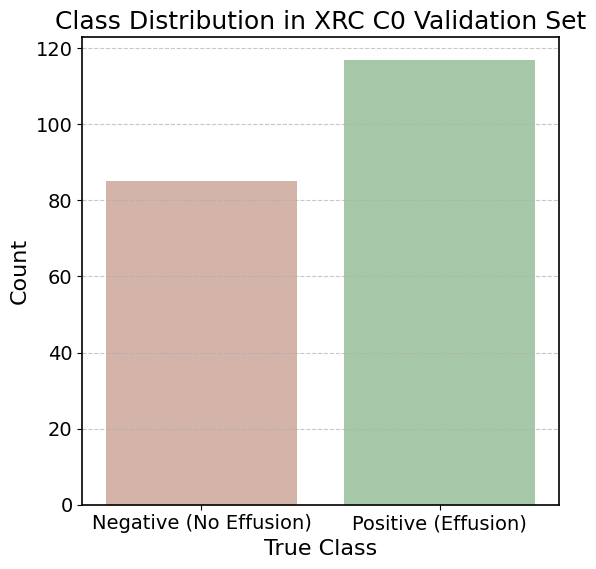

In [16]:
# Plot number of sampels per class as hist
plt.figure(figsize=(6, 6))
sns.countplot(x='effusion_true', data=val_c0_xrv_reduced, palette=["#ba6146", "#439e49"], alpha=0.5)
plt.xticks([0, 1], ['Negative (No Effusion)', 'Positive (Effusion)'])
plt.title('Class Distribution in XRC C0 Validation Set')
plt.xlabel('True Class')
plt.ylabel('Count')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [17]:
# Separate by class (positice for effusion, negative for no effusion)
val_c0_positive = val_c0_xrv_reduced[val_c0_xrv_reduced['effusion_true'] == 1]
val_c0_negative = val_c0_xrv_reduced[val_c0_xrv_reduced['effusion_true'] == 0]

Positive samples: 117
Negative samples: 85


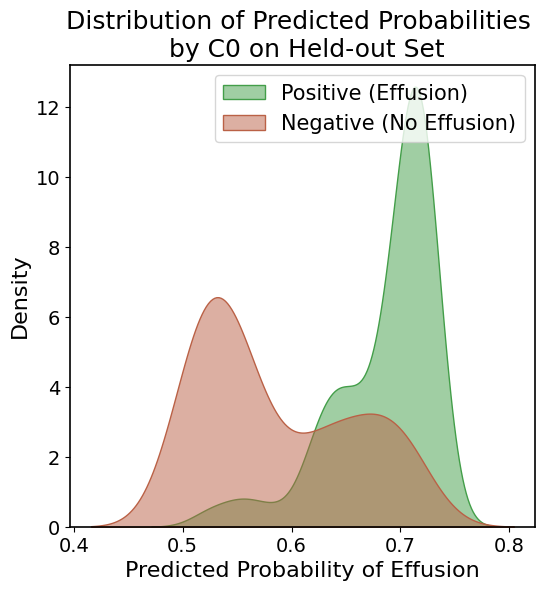

In [18]:
# Print sizes
print(f"Positive samples: {len(val_c0_positive)}")
print(f"Negative samples: {len(val_c0_negative)}")
# Plot histograms of the predicted probabilities for both classes in th esame plot (2 colours), make curves semi-transparent so we can see overlap, add labels and legend
# Gaussian KDE plot instead of histogram
plt.figure(figsize=(6, 6))
sns.kdeplot(val_c0_positive['effusion_prob'], label='Positive (Effusion)', fill=True, alpha=0.5, color="#439e49")
sns.kdeplot(val_c0_negative['effusion_prob'], label='Negative (No Effusion)', fill=True, alpha=0.5, color="#ba6146")
plt.title('Distribution of Predicted Probabilities \n by C0 on Held-out Set')
plt.xlabel('Predicted Probability of Effusion')
plt.ylabel('Density')
plt.legend()
plt.show()

In [19]:
# Look at C2 preictions inc cross val
fold_0 = pd.read_csv("/zhome/d0/a/221493/thesis/results/C2_sim_cf/effusion/cv_results/cf_1/fold_0_predictions.csv")
fold_1 = pd.read_csv("/zhome/d0/a/221493/thesis/results/C2_sim_cf/effusion/cv_results/cf_1/fold_1_predictions.csv")
fold_2 = pd.read_csv("/zhome/d0/a/221493/thesis/results/C2_sim_cf/effusion/cv_results/cf_1/fold_2_predictions.csv")
fold_3 = pd.read_csv("/zhome/d0/a/221493/thesis/results/C2_sim_cf/effusion/cv_results/cf_1/fold_3_predictions.csv")

combined_folds = pd.concat([fold_0, fold_1, fold_2, fold_3], ignore_index=True)
combined_folds

,path,effusion_prob,effusion_true,emb_0,emb_1,emb_2,emb_3,emb_4,emb_5,emb_6,...,MLP_B2_prob,MLP_B3_prob,MLP_B4_prob,MLP_B5_prob,MLP_M1_prob,MLP_M2_prob,MLP_M3_prob,MLP_M4_prob,MLP_M5_prob,MLP_M6_prob
0,CheXpert-v1.0-small/train/patient00002/study1/...,0.651720,1.0,-0.579125,-0.425111,-0.418812,-0.471462,-0.166978,-0.484519,-1.162112,...,0.671494,0.286221,0.348656,0.160482,0.972567,0.397064,0.000010,0.109736,0.001678,0.018256
1,CheXpert-v1.0-small/train/patient00011/study7/...,0.714866,1.0,-0.411366,-0.453569,-0.271869,-0.395655,-0.069340,-0.392941,-0.633106,...,0.826438,0.972022,0.993656,0.962022,0.964210,0.996838,0.999925,0.977932,0.993138,0.999895
2,CheXpert-v1.0-small/train/patient00011/study8/...,0.717970,1.0,-0.447257,-0.467377,0.029152,-0.557615,-0.113559,-0.495558,-0.472730,...,0.990396,0.963620,0.996569,0.976861,0.992486,0.999769,0.999998,1.000000,0.999286,0.999847
3,CheXpert-v1.0-small/train/patient00011/study3/...,0.706425,1.0,-0.490442,-0.503698,-0.094973,-0.536125,-0.223851,-0.454152,-0.714976,...,0.986685,0.951934,0.994355,0.979301,0.986192,0.997435,0.998760,0.998403,0.999343,0.998283
4,CheXpert-v1.0-small/train/patient00019/study2/...,0.706989,1.0,-0.452052,-0.460723,-0.111568,-0.534805,-0.025209,-0.494080,-0.648474,...,0.813168,0.911738,0.833079,0.954671,0.757924,0.971632,0.994164,0.964653,0.970964,0.982421
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78159,CheXpert-v1.0-small/train/patient47337/study3/...,0.718761,1.0,-0.412947,-0.339135,-0.258185,-0.621201,-0.544835,-0.686000,0.102423,...,0.987117,0.982063,0.990667,0.982532,0.939247,0.979641,0.993057,0.981503,0.997992,0.999209
78160,CheXpert-v1.0-small/train/patient47337/study2/...,0.710780,1.0,-0.419193,-0.430494,-0.108276,-0.495171,-0.056286,-0.511759,-0.292273,...,0.981038,0.869267,0.980182,0.964946,0.992458,0.998237,0.998669,0.985080,0.984793,0.999998
78161,CheXpert-v1.0-small/train/patient47340/study2/...,0.697555,1.0,-0.619848,-0.414743,-0.236444,-0.682631,-0.250911,-0.671021,-0.853219,...,0.957762,0.947821,0.949025,0.888948,0.962683,0.991801,0.994628,0.932545,0.988321,0.992882
78162,CheXpert-v1.0-small/train/patient47345/study1/...,0.686880,1.0,-0.337318,-0.506884,-0.184867,-0.361343,-0.430838,-0.335983,-0.223838,...,0.983412,0.967761,0.927544,0.947060,0.999676,0.999731,0.996842,0.998654,0.999938,0.999999


In [20]:
fold_0

,path,effusion_prob,effusion_true,emb_0,emb_1,emb_2,emb_3,emb_4,emb_5,emb_6,...,MLP_B2_prob,MLP_B3_prob,MLP_B4_prob,MLP_B5_prob,MLP_M1_prob,MLP_M2_prob,MLP_M3_prob,MLP_M4_prob,MLP_M5_prob,MLP_M6_prob
0,CheXpert-v1.0-small/train/patient00002/study1/...,0.651720,1.0,-0.579125,-0.425111,-0.418812,-0.471462,-0.166978,-0.484519,-1.162112,...,0.671494,0.286221,0.348656,0.160482,0.972567,0.397064,0.000010,0.109736,0.001678,0.018256
1,CheXpert-v1.0-small/train/patient00011/study7/...,0.714866,1.0,-0.411366,-0.453569,-0.271869,-0.395655,-0.069340,-0.392941,-0.633106,...,0.826438,0.972022,0.993656,0.962022,0.964210,0.996838,0.999925,0.977932,0.993138,0.999895
2,CheXpert-v1.0-small/train/patient00011/study8/...,0.717970,1.0,-0.447257,-0.467377,0.029152,-0.557615,-0.113559,-0.495558,-0.472730,...,0.990396,0.963620,0.996569,0.976861,0.992486,0.999769,0.999998,1.000000,0.999286,0.999847
3,CheXpert-v1.0-small/train/patient00011/study3/...,0.706425,1.0,-0.490442,-0.503698,-0.094973,-0.536125,-0.223851,-0.454152,-0.714976,...,0.986685,0.951934,0.994355,0.979301,0.986192,0.997435,0.998760,0.998403,0.999343,0.998283
4,CheXpert-v1.0-small/train/patient00019/study2/...,0.706989,1.0,-0.452052,-0.460723,-0.111568,-0.534805,-0.025209,-0.494080,-0.648474,...,0.813168,0.911738,0.833079,0.954671,0.757924,0.971632,0.994164,0.964653,0.970964,0.982421
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19536,CheXpert-v1.0-small/train/patient47342/study3/...,0.721787,0.0,-0.432062,-0.397634,-0.268402,-0.567783,-0.313835,-0.560719,-0.483744,...,0.867310,0.982479,0.943213,0.989945,0.991442,0.985254,0.998762,0.961904,0.869938,0.875930
19537,CheXpert-v1.0-small/train/patient47344/study1/...,0.527627,0.0,-0.537102,-0.536096,-0.411523,-0.347486,-0.327698,-0.327212,-0.882819,...,0.527033,0.714196,0.605017,0.651315,0.971618,0.996389,1.000000,0.993238,0.997208,0.999529
19538,CheXpert-v1.0-small/train/patient47347/study4/...,0.714514,1.0,-0.526402,-0.479968,-0.376999,-0.530452,-0.167948,-0.533402,-0.747066,...,0.991754,0.953299,0.991560,0.984459,0.989338,0.997566,0.999998,0.988603,0.998922,0.999476
19539,CheXpert-v1.0-small/train/patient47348/study2/...,0.709640,1.0,-0.462506,-0.423881,-0.093223,-0.562183,0.073622,-0.559743,-0.801186,...,0.860859,0.959365,0.885827,0.950506,0.812622,0.722101,0.993330,0.997656,0.798703,0.829616


In [21]:
# Relevant columns: prob, true, pred, correct, margin
# Create a copy with just these columns
folds_reduced = combined_folds[['path', 'effusion_prob', 'effusion_true', 'effusion_pred', 'correct', 'margin', 'LR_B1_prob']].copy()
folds_reduced

,path,effusion_prob,effusion_true,effusion_pred,correct,margin,LR_B1_prob
0,CheXpert-v1.0-small/train/patient00002/study1/...,0.651720,1.0,0,0,0.002726,0.490212
1,CheXpert-v1.0-small/train/patient00011/study7/...,0.714866,1.0,1,1,0.060419,0.735890
2,CheXpert-v1.0-small/train/patient00011/study8/...,0.717970,1.0,1,1,0.063524,0.745929
3,CheXpert-v1.0-small/train/patient00011/study3/...,0.706425,1.0,1,1,0.051978,0.707340
4,CheXpert-v1.0-small/train/patient00019/study2/...,0.706989,1.0,1,1,0.052543,0.709306
...,...,...,...,...,...,...,...
78159,CheXpert-v1.0-small/train/patient47337/study3/...,0.718761,1.0,1,1,0.064315,0.749787
78160,CheXpert-v1.0-small/train/patient47337/study2/...,0.710780,1.0,1,1,0.056334,0.723548
78161,CheXpert-v1.0-small/train/patient47340/study2/...,0.697555,1.0,1,1,0.043109,0.676523
78162,CheXpert-v1.0-small/train/patient47345/study1/...,0.686880,1.0,1,1,0.032434,0.635713


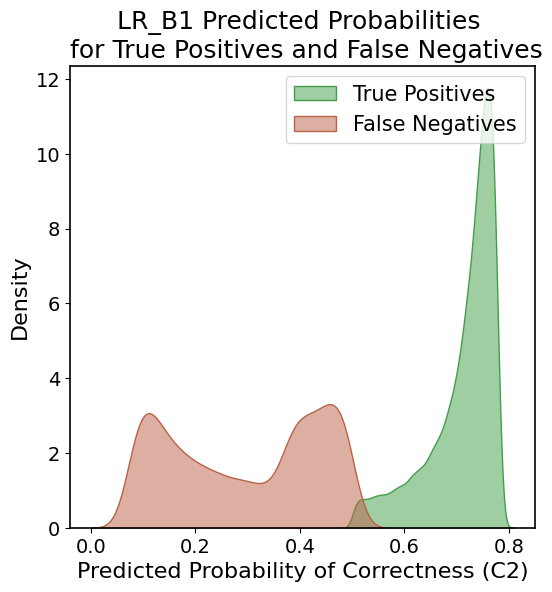

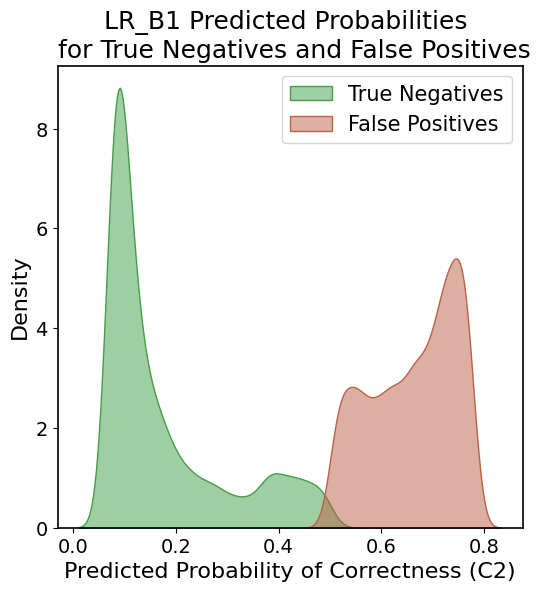

In [34]:

# Plot LR_B1_prob distribution for tyure positives andfalse negatives for disease present and true negatives and false positives for disease absent
# Two plots, one for disease present and one for disease absent
# Disease present (true positives and false negatives)
plt.figure(figsize=(6, 6))
sns.kdeplot(folds_reduced[(folds_reduced['effusion_true'] == 1) & (folds_reduced['correct'] == 1)]['LR_B1_prob'], label='True Positives', fill=True, alpha=0.5, color="#439e49")
sns.kdeplot(folds_reduced[(folds_reduced['effusion_true'] == 1) & (folds_reduced['correct'] == 0)]['LR_B1_prob'], label='False Negatives', fill=True, alpha=0.5, color="#ba6146")    
plt.title('LR_B1 Predicted Probabilities \n for True Positives and False Negatives')
plt.xlabel('Predicted Probability of Correctness (C2)')
plt.ylabel('Density')
plt.legend()
plt.show()

# Disease absent (true negatives and false positives)
plt.figure(figsize=(6, 6))
sns.kdeplot(folds_reduced[(folds_reduced['effusion_true'] == 0) & (folds_reduced['correct'] == 1)]['LR_B1_prob'], label='True Negatives', fill=True, alpha=0.5, color="#439e49")
sns.kdeplot(folds_reduced[(folds_reduced['effusion_true'] == 0) & (folds_reduced['correct'] == 0)]['LR_B1_prob'], label='False Positives', fill=True, alpha=0.5, color="#ba6146")    
plt.title('LR_B1 Predicted Probabilities \n for True Negatives and False Positives')
plt.xlabel('Predicted Probability of Correctness (C2)')
plt.ylabel('Density')
plt.legend()
plt.show()

In [31]:
#   Print ammoiunt of : positive cases, negative cases, and then inside each of those, the amount of true positives, false negatives, true negatives, and false positives
total_positive = len(folds_reduced[folds_reduced['effusion_true'] == 1])
total_negative = len(folds_reduced[folds_reduced['effusion_true'] == 0])
true_positives = len(folds_reduced[(folds_reduced['effusion_true'] == 1) & (folds_reduced['correct'] == 1)])
false_negatives = len(folds_reduced[(folds_reduced['effusion_true'] == 1) & (folds_reduced['correct'] == 0)])
true_negatives = len(folds_reduced[(folds_reduced['effusion_true'] == 0) & (folds_reduced['correct'] == 1)])
false_positives = len(folds_reduced[(folds_reduced['effusion_true'] == 0) & (folds_reduced['correct'] == 0)])
print(f"Total positive cases: {total_positive}")
print(f"Total negative cases: {total_negative}")
print(f"True positives: {true_positives}")
print(f"False negatives: {false_negatives}")
print(f"True negatives: {true_negatives}")
print(f"False positives: {false_positives}")

Total positive cases: 64730
Total negative cases: 13434
True positives: 54425
False negatives: 10305
True negatives: 10515
False positives: 2919


In [33]:
ratio_positives = total_positive / (total_positive + total_negative)
print(f"Ratio of positives: {ratio_positives:.4f}") 

Ratio of positives: 0.8281


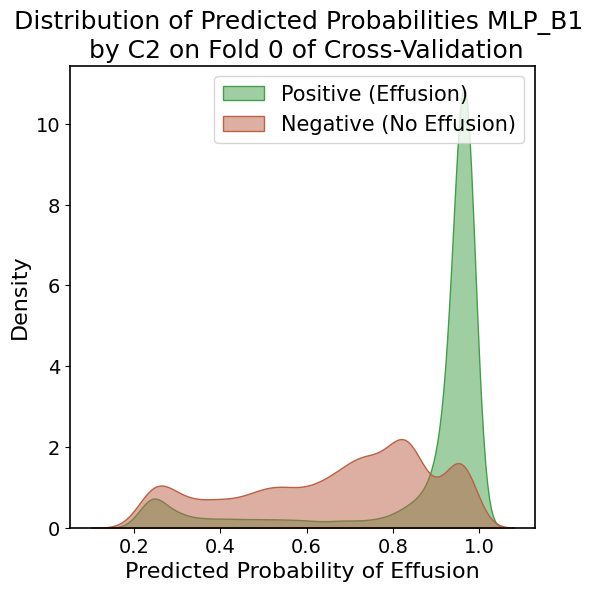

In [ ]:
# Now same but for MLP_B1_prob
# Make the copy with this column as well
folds_reduced = combined_folds[['path', 'effusion_prob', 'effusion_true', 'effusion_pred', 'correct', 'margin', 'MLP_B1_prob']].copy()
plt.figure(figsize=(6, 6))
sns.kdeplot(folds_reduced[folds_reduced['effusion_true'] == 1]['MLP_B1_prob'], label='Positive (Effusion)', fill=True, alpha=0.5, color="#439e49")
sns.kdeplot(folds_reduced[folds_reduced['effusion_true'] == 0]['MLP_B1_prob'], label='Negative (No Effusion)', fill=True, alpha=0.5, color="#ba6146")
plt.title('Distribution of Predicted Probabilities MLP_B1 \n by C2 on Fold 0 of Cross-Validation')
plt.xlabel('Predicted Probability of Effusion')
plt.ylabel('Density')
plt.show()

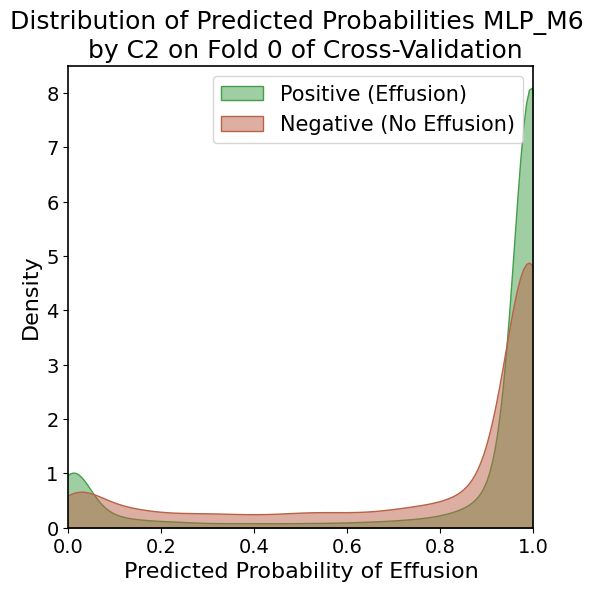

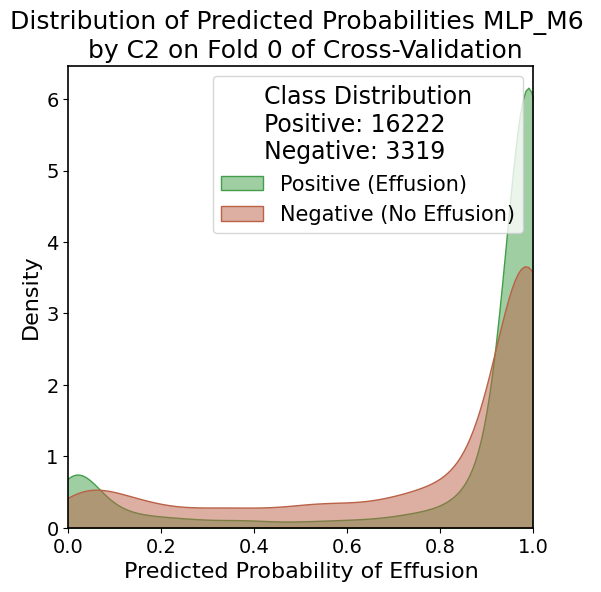

In [49]:
# Now same but for MLP_B1_prob
# Make the copy with this column as well


folds_reduced = combined_folds[['path', 'effusion_prob', 'effusion_true', 'effusion_pred', 'correct', 'margin', 'MLP_M6_prob']].copy()
plt.figure(figsize=(6, 6))
sns.kdeplot(folds_reduced[folds_reduced['effusion_true'] == 1]['MLP_M6_prob'], label='Positive (Effusion)', fill=True, alpha=0.5, color="#439e49")
sns.kdeplot(folds_reduced[folds_reduced['effusion_true'] == 0]['MLP_M6_prob'], label='Negative (No Effusion)', fill=True, alpha=0.5, color="#ba6146")
plt.title('Distribution of Predicted Probabilities MLP_M6 \n by C2 on Fold 0 of Cross-Validation')
plt.xlabel('Predicted Probability of Effusion')
plt.ylabel('Density')
plt.xlim(0, 1)
plt.legend()
plt.show()

# using just fold0

fold_0_reduced = fold_0[['path', 'effusion_prob', 'effusion_true', 'effusion_pred', 'correct', 'margin', 'MLP_M6_prob']].copy()
plt.figure(figsize=(6, 6))
sns.kdeplot(fold_0_reduced[fold_0_reduced['effusion_true'] == 1]['MLP_M6_prob'], label='Positive (Effusion)', fill=True, alpha=0.5, color="#439e49")
sns.kdeplot(fold_0_reduced[fold_0_reduced['effusion_true'] == 0]['MLP_M6_prob'], label='Negative (No Effusion)', fill=True, alpha=0.5, color="#ba6146")
plt.title('Distribution of Predicted Probabilities MLP_M6 \n by C2 on Fold 0 of Cross-Validation')
plt.xlabel('Predicted Probability of Effusion')
plt.ylabel('Density')
plt.xlim(0, 1)
# number in legend for each class
positive_count = len(fold_0_reduced[fold_0_reduced['effusion_true'] == 1])
negative_count = len(fold_0_reduced[fold_0_reduced['effusion_true'] == 0])
plt.legend(title=f'Class Distribution\nPositive: {positive_count}\nNegative: {negative_count}')
plt.show()

---

In [41]:
# Load teh original trainset
train_c0 = pd.read_csv('/zhome/d0/a/221493/thesis/data/CheXpert-v1.0-small/train.csv')
train_c0

,Path,Sex,Age,Frontal/Lateral,AP/PA,No Finding,Enlarged Cardiomediastinum,Cardiomegaly,Lung Opacity,Lung Lesion,Edema,Consolidation,Pneumonia,Atelectasis,Pneumothorax,Pleural Effusion,Pleural Other,Fracture,Support Devices
0,CheXpert-v1.0-small/train/patient00001/study1/...,Female,68,Frontal,AP,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,1.0
1,CheXpert-v1.0-small/train/patient00002/study2/...,Female,87,Frontal,AP,NaN,NaN,-1.0,1.0,NaN,-1.0,-1.0,NaN,-1.0,NaN,-1.0,NaN,1.0,NaN
2,CheXpert-v1.0-small/train/patient00002/study1/...,Female,83,Frontal,AP,NaN,NaN,NaN,1.0,NaN,NaN,-1.0,NaN,NaN,NaN,NaN,NaN,1.0,NaN
3,CheXpert-v1.0-small/train/patient00002/study1/...,Female,83,Lateral,NaN,NaN,NaN,NaN,1.0,NaN,NaN,-1.0,NaN,NaN,NaN,NaN,NaN,1.0,NaN
4,CheXpert-v1.0-small/train/patient00003/study1/...,Male,41,Frontal,AP,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
223409,CheXpert-v1.0-small/train/patient64537/study2/...,Male,59,Frontal,AP,NaN,NaN,NaN,-1.0,NaN,NaN,NaN,NaN,-1.0,0.0,1.0,NaN,NaN,NaN
223410,CheXpert-v1.0-small/train/patient64537/study1/...,Male,59,Frontal,AP,NaN,NaN,NaN,-1.0,NaN,NaN,NaN,0.0,-1.0,NaN,-1.0,NaN,NaN,NaN
223411,CheXpert-v1.0-small/train/patient64538/study1/...,Female,0,Frontal,AP,NaN,NaN,NaN,NaN,NaN,-1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
223412,CheXpert-v1.0-small/train/patient64539/study1/...,Female,0,Frontal,AP,NaN,NaN,1.0,1.0,NaN,NaN,NaN,-1.0,1.0,0.0,NaN,NaN,NaN,0.0


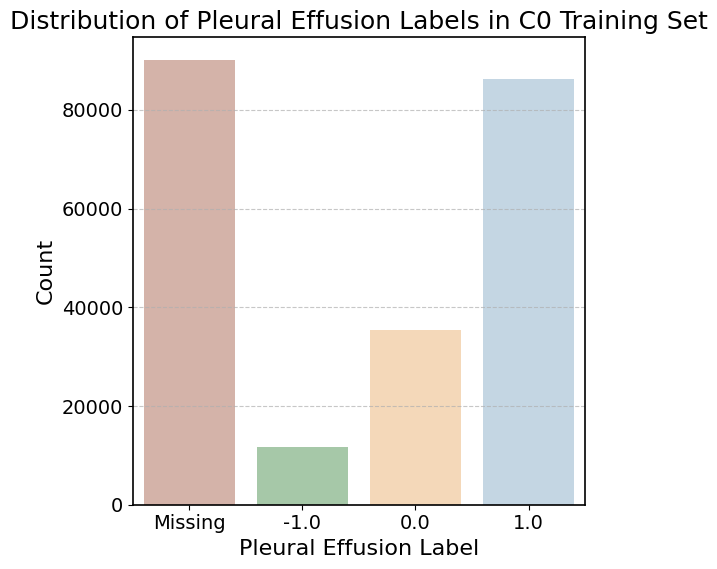

In [43]:
# Distribution of the Pleural Effusion column, which includes 1, 0, -1 and empty (N)
# Fill empty with "Missing"
train_c0['Pleural Effusion'] = train_c0['Pleural Effusion'].fillna('Missing')   
plt.figure(figsize=(6, 6))
sns.countplot(x='Pleural Effusion', data=train_c0, palette=["#ba6146", "#439e49", "#fdb462", "#80b1d3"], alpha=0.5)
plt.title('Distribution of Pleural Effusion Labels in C0 Training Set')
plt.xlabel('Pleural Effusion Label')
plt.ylabel('Count')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()
